### Importation des packages necessaires

In [1]:
import os
import re
import sys
import librosa
import warnings
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import librosa.display
import plotly.express as px
import matplotlib.pyplot as plt
from IPython.display import Audio

if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

### Data Preparation

In [2]:
# Creation de path pour les donnnées
Ravdess = os.getcwd() + "/Ravdess/"
Crema = os.getcwd() + "/Crema/AudioWAV/"
Tess = os.getcwd() + "/Tess/"
Savee = os.getcwd() + "/Savee/ALL/"

#### 1. Ravdess Dataframe

In [3]:
ravdess_directory_list = os.listdir(Ravdess)

emotion_df = []

for dir in ravdess_directory_list:
    actor = os.listdir(os.path.join(Ravdess, dir))
    for wav in actor:
        info = wav.partition(".wav")[0].split("-")
        emotion = int(info[2])
        emotion_df.append((emotion, os.path.join(Ravdess, dir, wav)))

Ravdess_df = pd.DataFrame.from_dict(emotion_df)
Ravdess_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

In [4]:
Ravdess_df.Emotion.replace({1:'neutral', 2:'neutral', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
Ravdess_df.head()

,Emotion,Path
0,surprise,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
1,neutral,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
2,angry,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
3,sad,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
4,fear,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...


In [5]:
def countplot(data):
    emotion_counts = data['Emotion'].value_counts().reset_index()
    
    # Rename columns
    emotion_counts.columns = ['Emotion', 'Count']
    
    # Create the Plotly bar chart
    fig = px.bar(emotion_counts, x='Emotion', y='Count', title='Count of Emotions',color='Emotion')
    
    # Remove top and right borders
    fig.update_layout(yaxis=dict(showgrid=False),
                      xaxis=dict(showgrid=False),
                      height=500,  # Set the height of the figure
                      width=800, 
                      )
    # Show the plot
    fig.show()

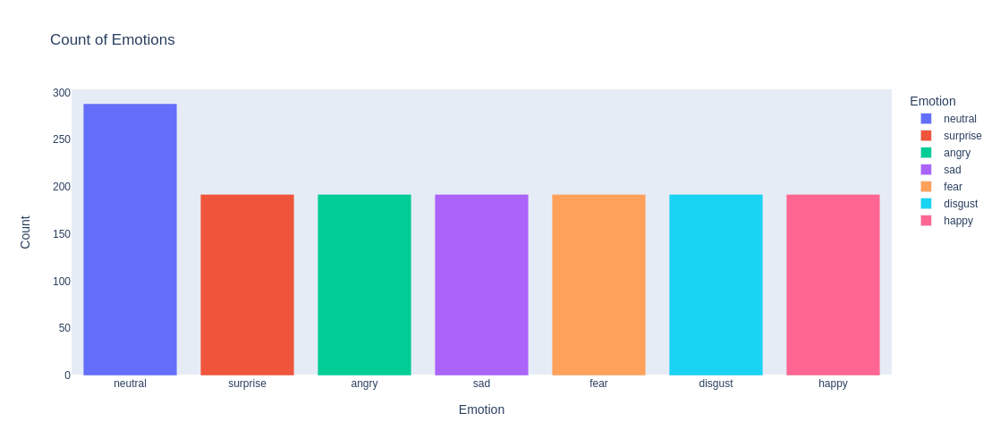

In [6]:
countplot(Ravdess_df)

#### 2. Crema DataFrame

In [7]:
emotion_df = []

for wav in os.listdir(Crema):
    info = wav.partition(".wav")[0].split("_")
    if info[2] == 'SAD':
        emotion_df.append(("sad", Crema + "/" + wav))
    elif info[2] == 'ANG':
        emotion_df.append(("angry", Crema + "/" + wav))
    elif info[2] == 'DIS':
        emotion_df.append(("disgust", Crema + "/" + wav))
    elif info[2] == 'FEA':
        emotion_df.append(("fear", Crema + "/" + wav))
    elif info[2] == 'HAP':
        emotion_df.append(("happy", Crema + "/" + wav))
    elif info[2] == 'NEU':
        emotion_df.append(("neutral", Crema + "/" + wav))
    else:
        emotion_df.append(("unknown", Crema + "/" + wav))


Crema_df = pd.DataFrame.from_dict(emotion_df)
Crema_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)
Crema_df.head()

,Emotion,Path
0,neutral,/home/hassouni/PFA/model/Crema/AudioWAV//1090_...
1,angry,/home/hassouni/PFA/model/Crema/AudioWAV//1019_...
2,angry,/home/hassouni/PFA/model/Crema/AudioWAV//1014_...
3,happy,/home/hassouni/PFA/model/Crema/AudioWAV//1056_...
4,fear,/home/hassouni/PFA/model/Crema/AudioWAV//1015_...


In [8]:
Crema_df['Emotion'].value_counts()

Emotion
angry      1271
happy      1271
fear       1271
sad        1271
disgust    1271
neutral    1087
Name: count, dtype: int64

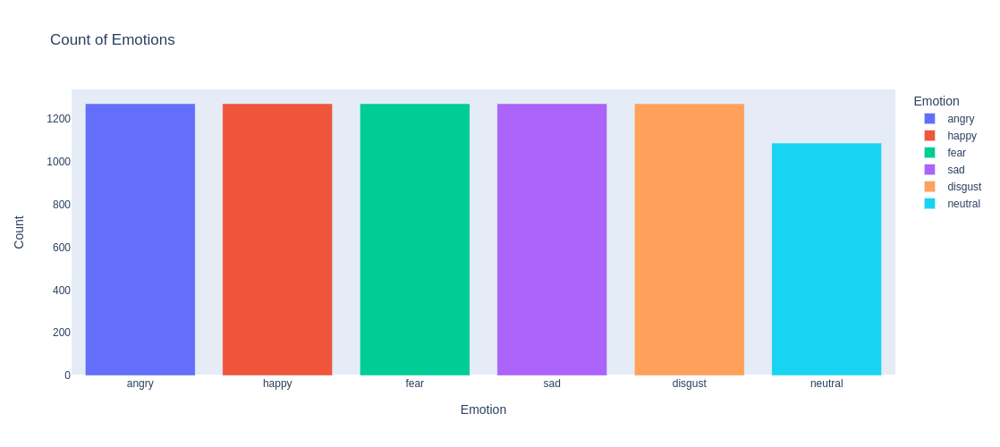

In [9]:
countplot(Crema_df)

#### 3. Tess Dataset

In [10]:
tess_directory_list = os.listdir(Tess)

emotion_df = []

for dir in tess_directory_list:
    for wav in os.listdir(os.path.join(Tess, dir)):
        info = wav.partition(".wav")[0].split("_")
        emo = info[2]
        if emo == "ps":
            emotion_df.append(("surprise", os.path.join(Tess, dir, wav)))
        else:
            emotion_df.append((emo, os.path.join(Tess, dir, wav)))


Tess_df = pd.DataFrame.from_dict(emotion_df)
Tess_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Tess_df.head()

,Emotion,Path
0,fear,/home/hassouni/PFA/model/Tess/YAF_fear/YAF_bou...
1,fear,/home/hassouni/PFA/model/Tess/YAF_fear/YAF_sur...
2,fear,/home/hassouni/PFA/model/Tess/YAF_fear/YAF_foo...
3,fear,/home/hassouni/PFA/model/Tess/YAF_fear/YAF_dol...
4,fear,/home/hassouni/PFA/model/Tess/YAF_fear/YAF_los...


In [11]:
Tess_df['Emotion'].value_counts()

Emotion
fear        400
happy       400
surprise    400
angry       400
disgust     400
neutral     400
sad         400
Name: count, dtype: int64

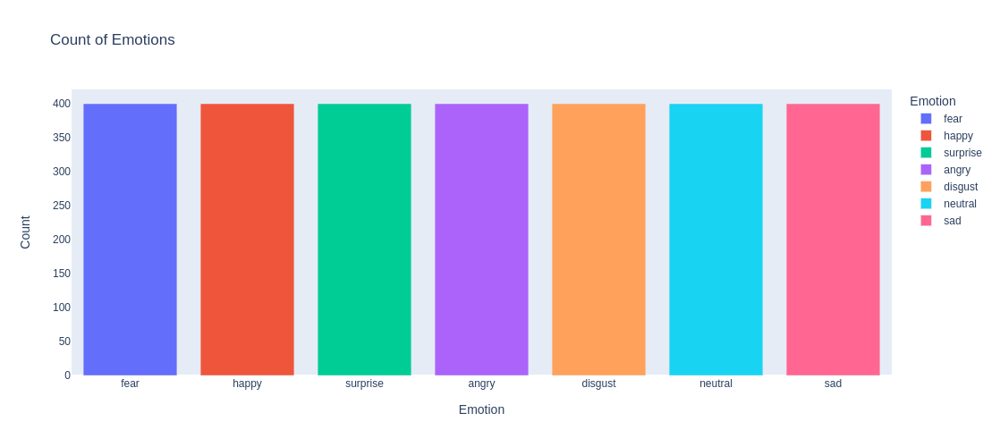

In [12]:
countplot(Tess_df)

#### 4. Savee dataset

In [13]:
savee_directiory_list = os.listdir(Savee)

emotion_df = []

for wav in savee_directiory_list:
    info = wav.partition(".wav")[0].split("_")[1].replace(r"[0-9]", "")
    emotion = re.split(r"[0-9]", info)[0]
    if emotion=='a':
        emotion_df.append(("angry", Savee + "/" + wav))
    elif emotion=='d':
        emotion_df.append(("disgust", Savee + "/" + wav))
    elif emotion=='f':
        emotion_df.append(("fear", Savee + "/" + wav))
    elif emotion=='h':
        emotion_df.append(("happy", Savee + "/" + wav))
    elif emotion=='n':
        emotion_df.append(("neutral", Savee + "/" + wav))
    elif emotion=='sa':
        emotion_df.append(("sad", Savee + "/" + wav))
    else:
        emotion_df.append(("surprise", Savee + "/" + wav))


Savee_df = pd.DataFrame.from_dict(emotion_df)
Savee_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Savee_df.head()

,Emotion,Path
0,sad,/home/hassouni/PFA/model/Savee/ALL//JK_sa14.wav
1,fear,/home/hassouni/PFA/model/Savee/ALL//KL_f05.wav
2,fear,/home/hassouni/PFA/model/Savee/ALL//JK_f14.wav
3,fear,/home/hassouni/PFA/model/Savee/ALL//JE_f10.wav
4,happy,/home/hassouni/PFA/model/Savee/ALL//JK_h15.wav


In [14]:
Savee_df['Emotion'].value_counts()

Emotion
neutral     120
sad          60
fear         60
happy        60
disgust      60
angry        60
surprise     60
Name: count, dtype: int64

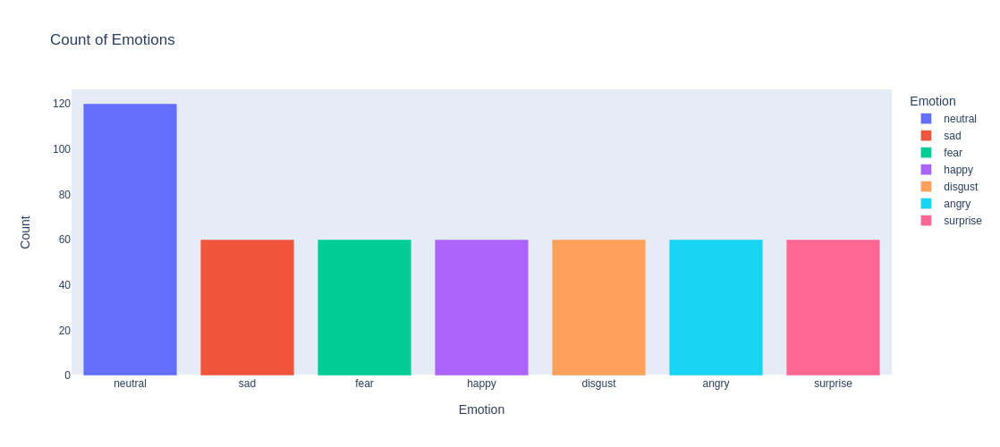

In [15]:
countplot(Savee_df)

In [16]:
# creating Dataframe using all the 4 dataframes we created so far.
df = pd.concat([Ravdess_df, Savee_df, Crema_df, Tess_df], axis = 0)
df.to_csv("data.csv",index=False)

In [17]:
df = pd.read_csv("data.csv") 
df.head()

,Emotion,Path
0,surprise,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
1,neutral,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
2,angry,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
3,sad,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...
4,fear,/home/hassouni/PFA/model/Ravdess/Actor_20/03-0...


In [18]:
# Dataframe chape
df.shape

(12162, 2)

In [19]:
print('Le nombre des observations:',df.Emotion.value_counts().sum())
df.Emotion.value_counts()

Le nombre des observations: 12162


Emotion
angry       1923
sad         1923
fear        1923
disgust     1923
happy       1923
neutral     1895
surprise     652
Name: count, dtype: int64

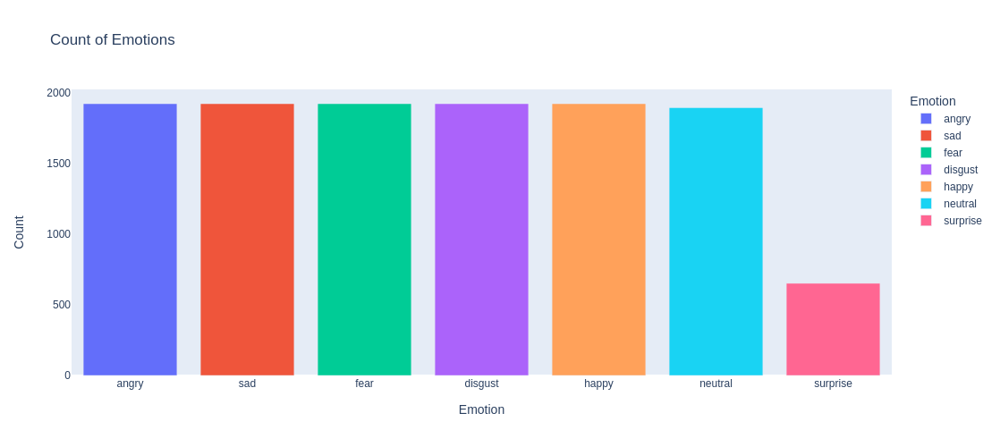

In [20]:
countplot(df)

### Tracer les ondes et les spectogrammes des signaux audio

In [21]:
# Waveplots let us know the loudness of the audio at a given time.
def create_waveplot(data,sr,emotion):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(emotion), size=15)
    plt.plot(np.arange(len(data)) / sr, data)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()
"""
    A spectrogram is a visual representation of the spectrum of 
    frequencies of sound or other signals as they vary with time. It’s a 
    representation of frequencies changing with respect to time for given audio/music signals.
"""
def create_spectrogram(data,sr,emotion):
    audio=librosa.stft(data)
    audio_db=librosa.amplitude_to_db(abs(audio))
    plt.figure(figsize=(12,5))
    plt.title(f'Spectrogram for audio with {emotion} emotion',size=17)
    librosa.display.specshow(audio_db,sr=sr,x_axis='time',y_axis='hz')

#### 1. fear

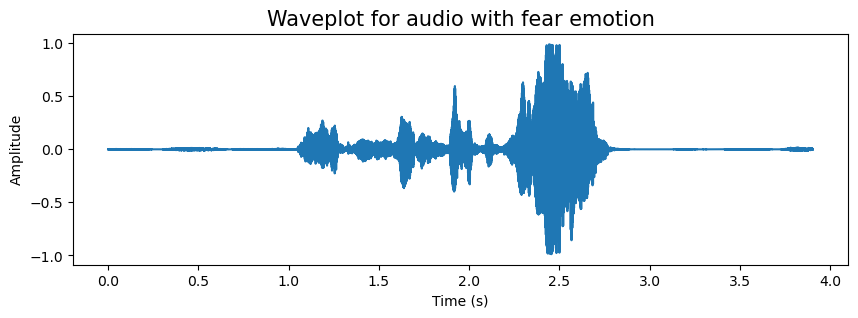

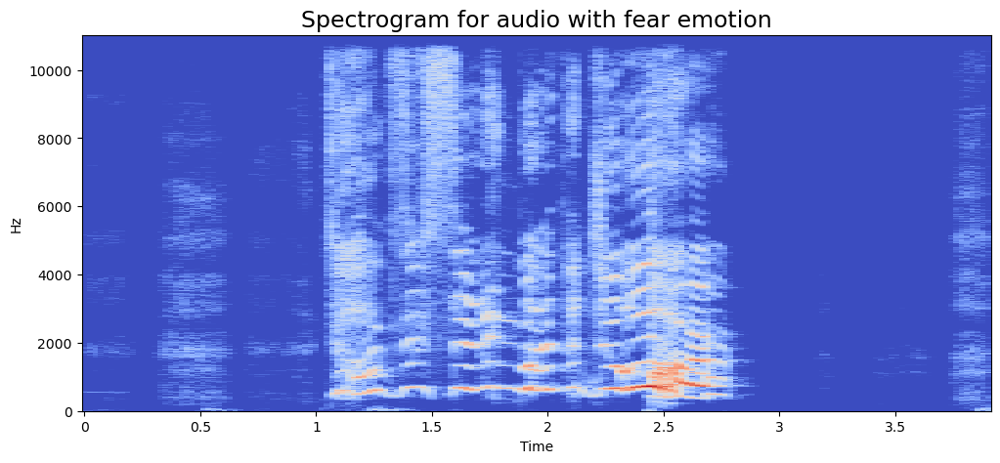

In [22]:
emotion='fear'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate,emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

#### 2. angry

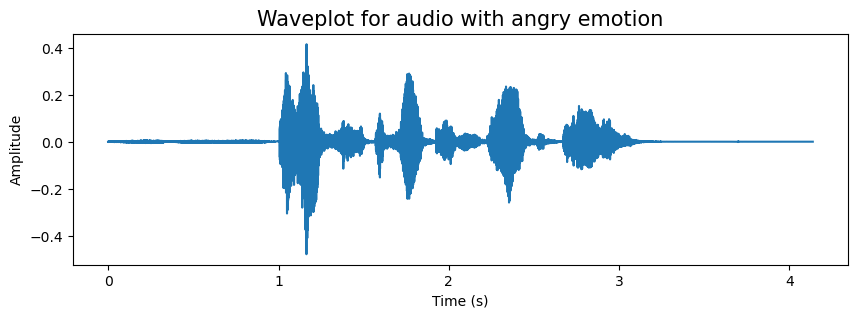

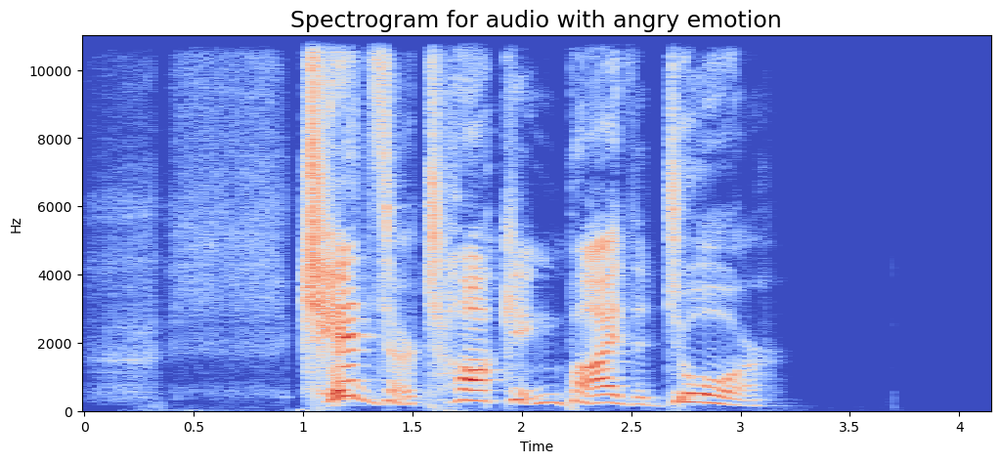

In [23]:
emotion='angry'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

##### 3. happy

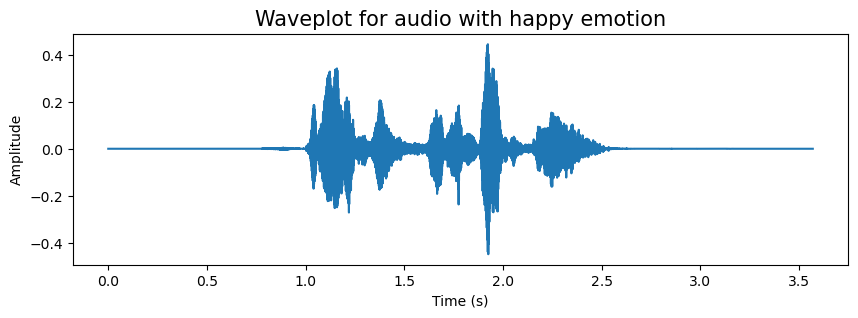

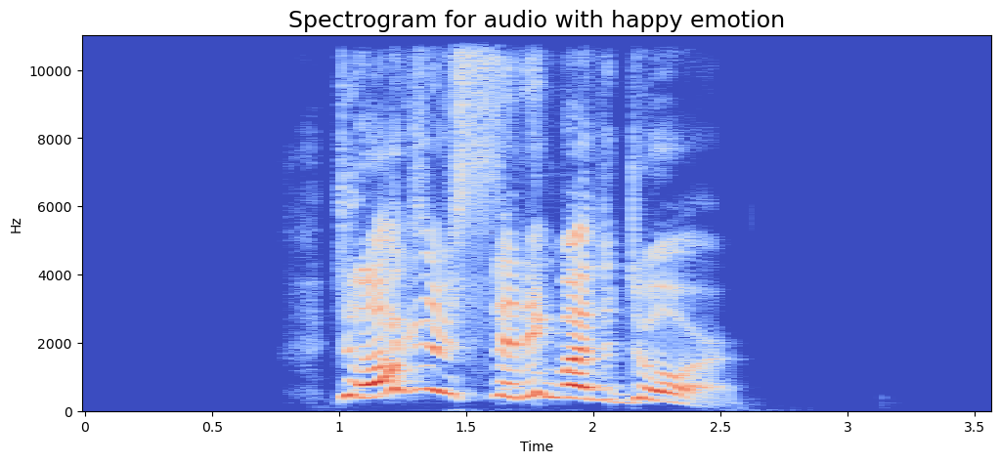

In [24]:
emotion='happy'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

#### 4. sad

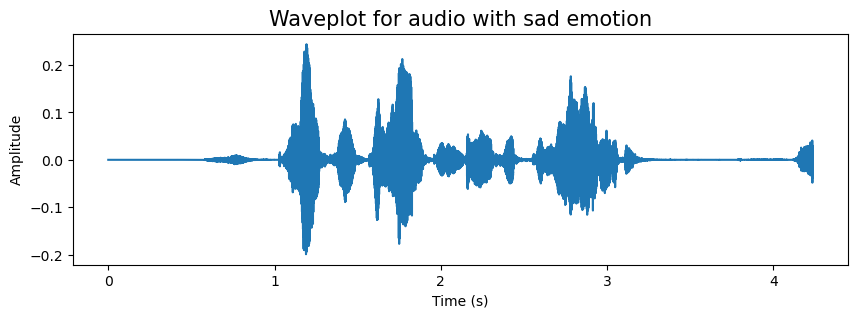

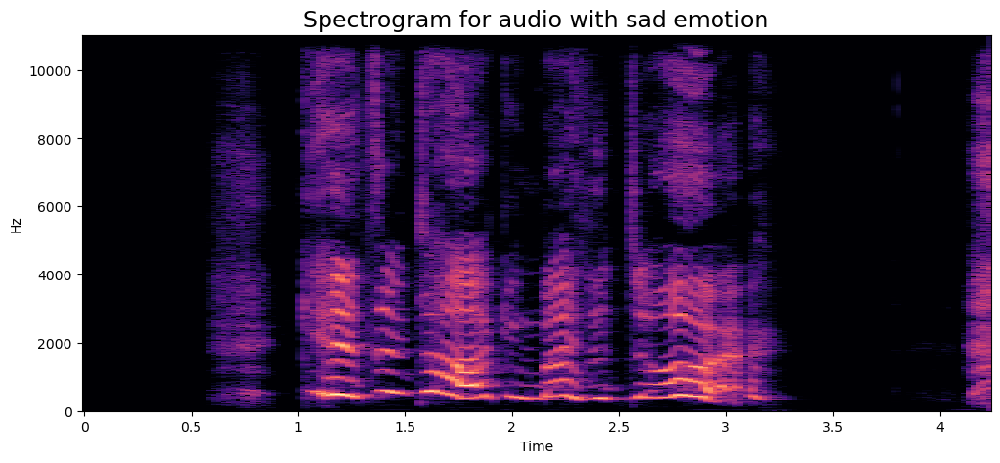

In [25]:
emotion='sad'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

##### 5. disgust

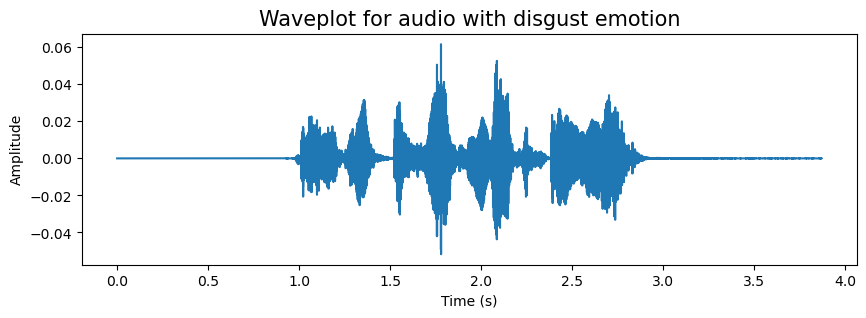

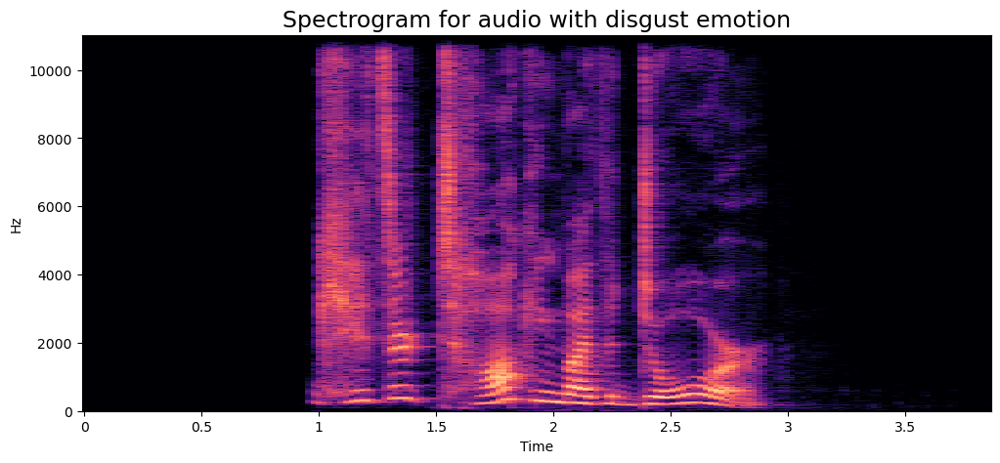

In [26]:
emotion='disgust'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

#### 6. neutral

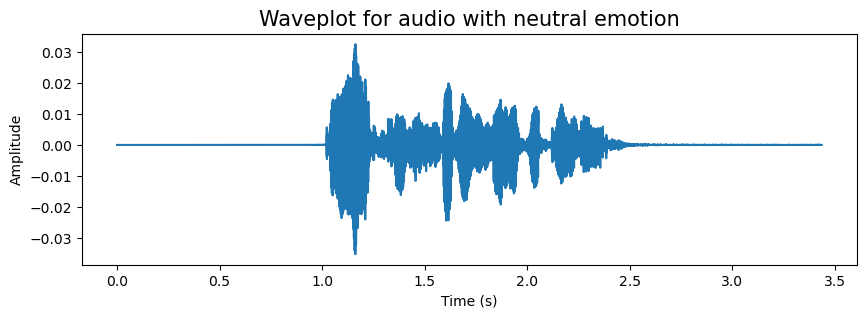

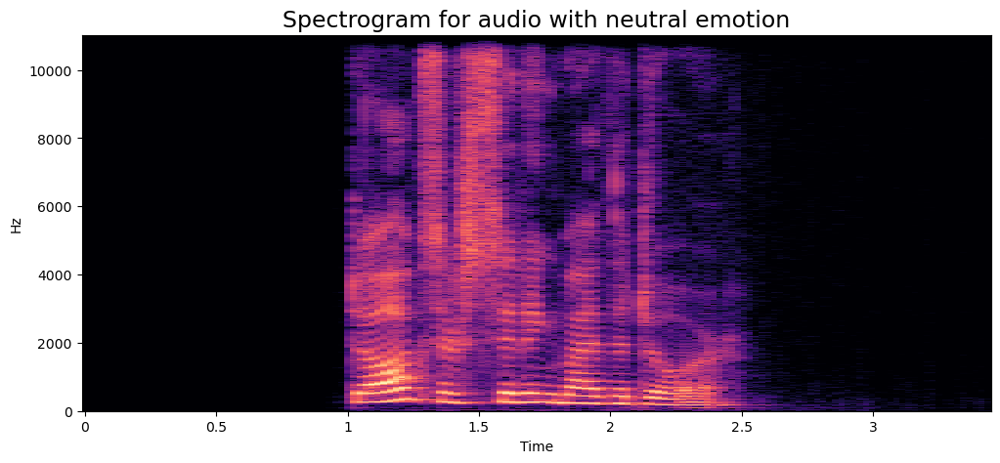

In [27]:
emotion='neutral'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

#### 7. surprise

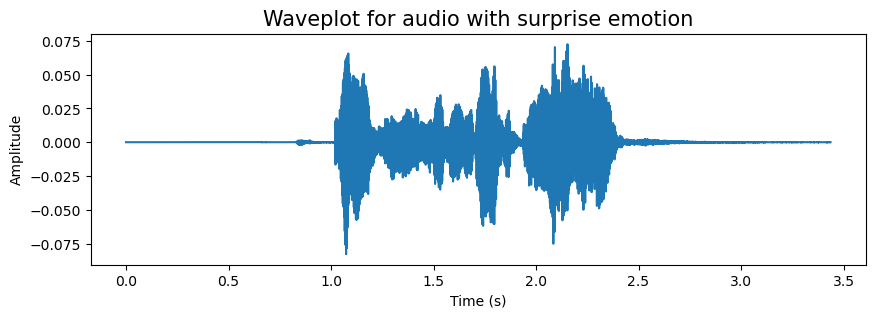

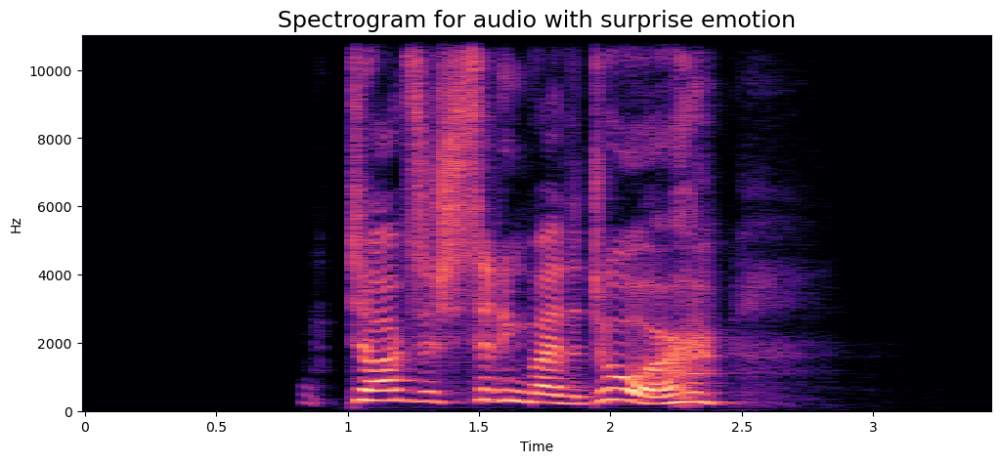

In [28]:
emotion='surprise'
path = np.array(df.Path[df.Emotion==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

### Data augmentation

 * Data augmentation is the process by which we create new synthetic data samples by adding small perturbations on our initial training set.
 * To generate syntactic data for audio, we can apply noise injection, shifting time, changing pitch and speed.
 * The objective is to make our model invariant to those perturbations and enhace its ability to generalize.
 * In order to this to work adding the perturbations must conserve the same label as the original training sample.

In [29]:
def noise(data, random=False, rate=0.035, threshold=0.075):
    """Add some noise to sound sample. Use random if you want to add random noise with some threshold.
    Or use rate Random=False and rate for always adding fixed noise."""
    if random:
        rate = np.random.random() * threshold
    noise_amp = rate*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    """Stretching data with some rate."""
    return librosa.effects.time_stretch(data, rate=rate)

def shift(data, rate=1000):
    """Shifting data with some rate"""
    shift_range = int(np.random.uniform(low=-5, high = 5)*rate)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7, random=False):
    """"Add some pitch to sound sample. Use random if you want to add random pitch with some threshold.
    Or use pitch_factor Random=False and rate for always adding fixed pitch."""
    if random:
        pitch_factor=np.random.random() * pitch_factor
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

##### 1. Simple Audio

In [30]:
path = df[df["Emotion"] == "sad"]["Path"].iloc[110]
data, sampling_rate = librosa.load(path)

<Figure size 1400x400 with 0 Axes>

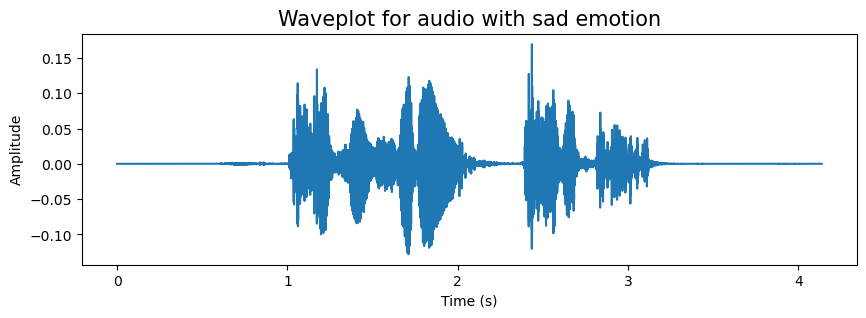

In [31]:
plt.figure(figsize=(14,4))
create_waveplot(data,sampling_rate,'sad')
Audio(path)

#### 2. shifting

<Figure size 1400x400 with 0 Axes>

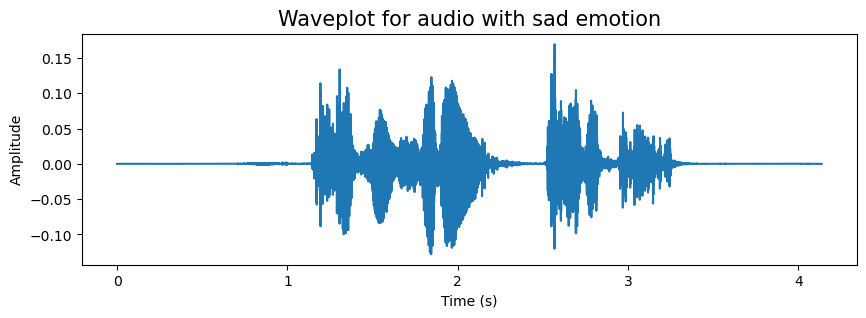

In [32]:
shifted_data = shift(data)
plt.figure(figsize=(14,4))
create_waveplot(shifted_data,sampling_rate,'sad')
Audio(shifted_data, rate=sampling_rate)

#### 3. noise injection

<Figure size 1400x400 with 0 Axes>

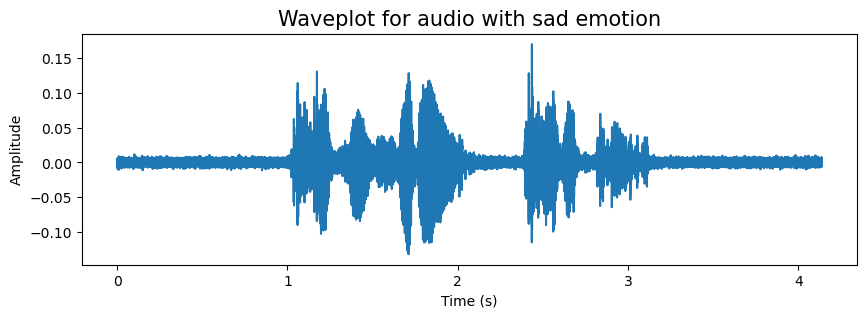

In [33]:
noised_data = noise(data)
plt.figure(figsize=(14,4))
create_waveplot(noised_data,sampling_rate,'sad')
Audio(shifted_data, rate=sampling_rate)

#### 4. stretching

<Figure size 1400x400 with 0 Axes>

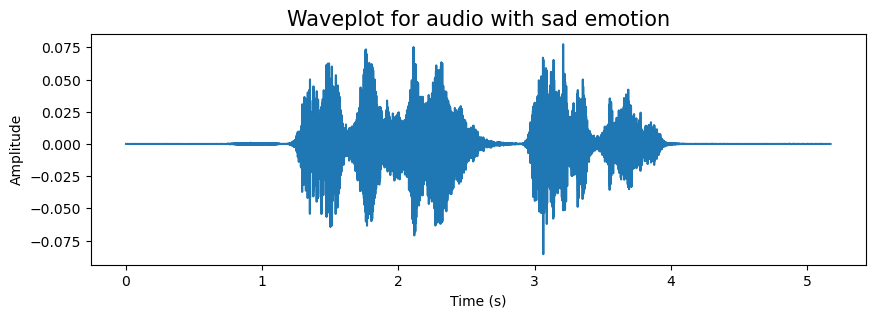

In [34]:
stretch_data = stretch(data)
plt.figure(figsize=(14,4))
create_waveplot(stretch_data,sampling_rate,'sad')
Audio(shifted_data, rate=sampling_rate)

##### 5. pitching

<Figure size 1400x400 with 0 Axes>

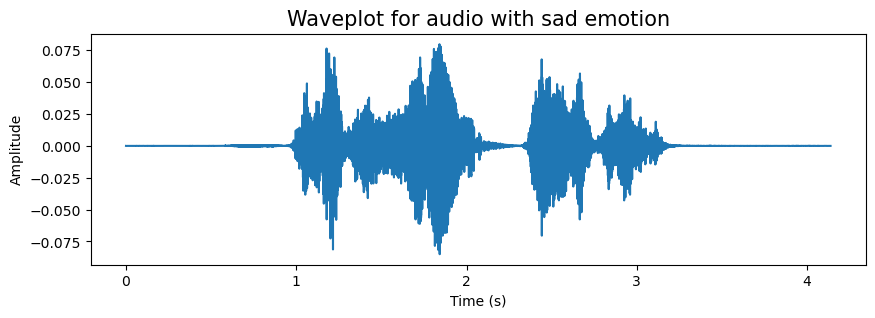

In [35]:
pitch_data = pitch(data,sampling_rate)
plt.figure(figsize=(14,4))
create_waveplot(pitch_data,sampling_rate,'sad')
Audio(shifted_data, rate=sampling_rate)

### Feature Extraction

In [36]:
# Zero Crossing Rate
def zcr(data, frame_length=2048, hop_length=512):
    zcr = librosa.feature.zero_crossing_rate(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(zcr)


def rmse(data, frame_length=2048, hop_length=512):
    rmse = librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(rmse)
    
def energy(data, frame_length=2048, hop_length=512):
    en = np.array([np.sum(np.power(np.abs(data[hop:hop+frame_length]), 2)) for hop in range(0, data.shape[0], hop_length)])
    return en / frame_length


def spc(data, sr, frame_length=2048, hop_length=512):
    spectral_centroid = librosa.feature.spectral_centroid(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(spectral_centroid)


def spc_rollof(data, sr, frame_length=2048, hop_length=512):
    spcrollof = librosa.feature.spectral_rolloff(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(spcrollof)


def chroma_stft(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    stft = np.abs(librosa.stft(data))
    chroma_stft = librosa.feature.chroma_stft(S=stft, sr=sr)
    return np.squeeze(chroma_stft.T) if not flatten else np.ravel(chroma_stft.T)


def mel_spc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mel = librosa.feature.melspectrogram(y=data, sr=sr)
    return np.squeeze(mel.T) if not flatten else np.ravel(mel.T)

def mfcc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mfcc_feature = librosa.feature.mfcc(y=data, sr=sr)
    return np.squeeze(mfcc_feature.T) if not flatten else np.ravel(mfcc_feature.T)

#### 1. data before feature extraction

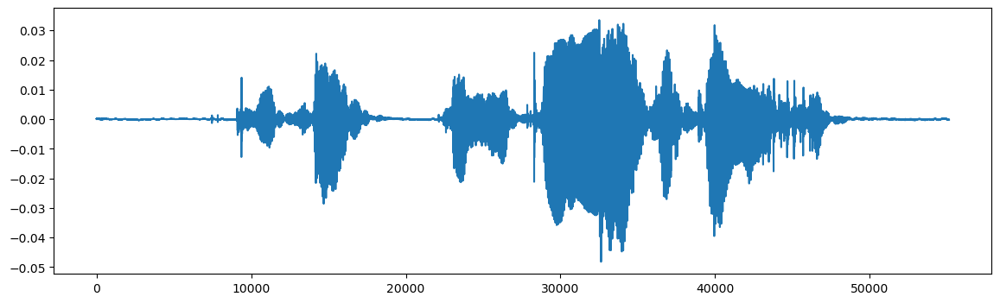

In [37]:
path = df[df["Emotion"] == "sad"]["Path"].iloc[15]
data, sampling_rate = librosa.load(path,duration=2.5,offset=0.6)
plt.figure(figsize=(14,4))
plt.plot(data)

In [38]:
def feature_extraction_plot(data_fitur,title):
    data_fitur = pd.Series(data_fitur)
    
    # Create a DataFrame for plotting
    df_plot = pd.DataFrame({'value': data_fitur})
    
    # Plot using Plotly Express
    fig = px.line(df_plot, x=df_plot.index, y='value', title=title)
    
    # Update layout
    fig.update_layout(
        height=400,  # Set the height of the figure
        width=800,   # Set the width of the figure
    )
    
    # Show the plot
    fig.show()

#### 2. rmse for feature extraction

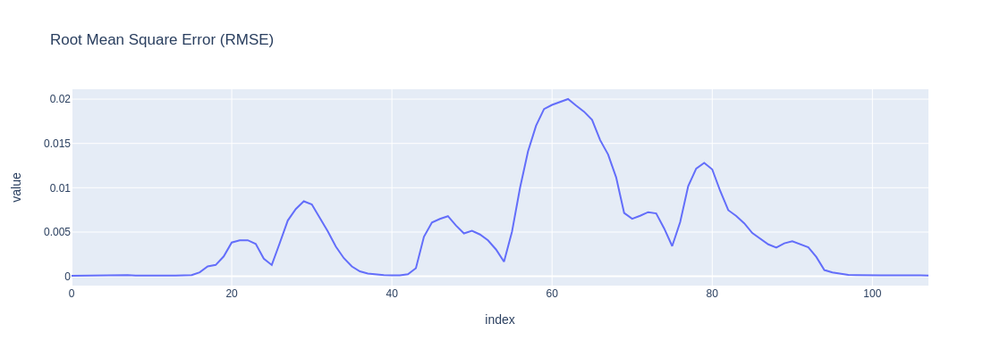

In [39]:
data_fitur =  rmse(data)
feature_extraction_plot(data_fitur,'Root Mean Square Error (RMSE)')

#### 3. mfcc

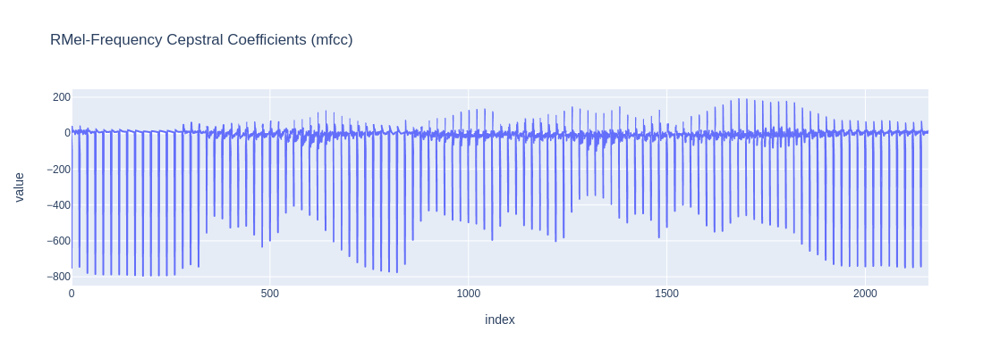

In [40]:
data_futur =  mfcc(data,sampling_rate)
feature_extraction_plot(data_futur,'RMel-Frequency Cepstral Coefficients (mfcc)')

#### 4. zcr

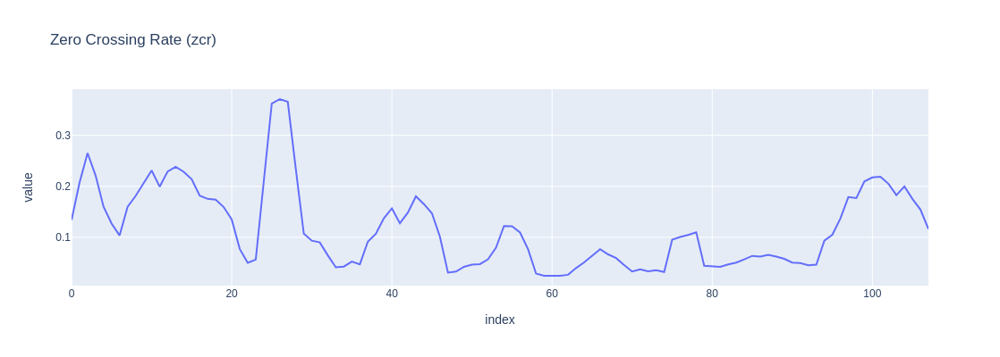

In [41]:
data_futur =  zcr(data)
feature_extraction_plot(data_futur,'Zero Crossing Rate (zcr)')

#### 5. energy

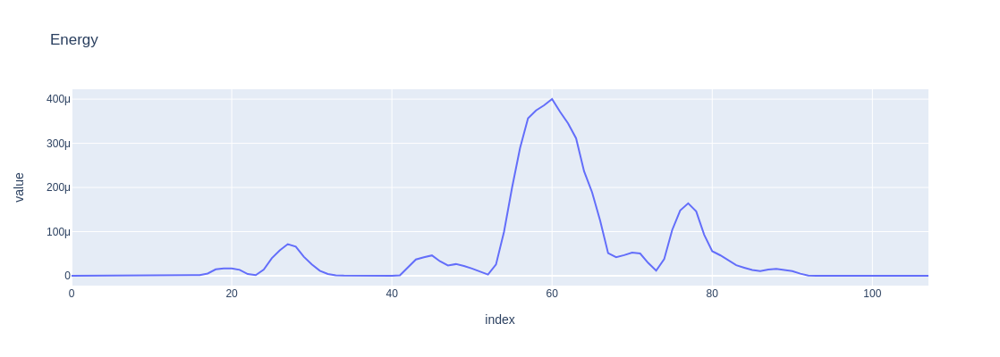

In [42]:
data_futur =  energy(data)
feature_extraction_plot(data_futur,'Energy')

#### 6. MelSpectrogram

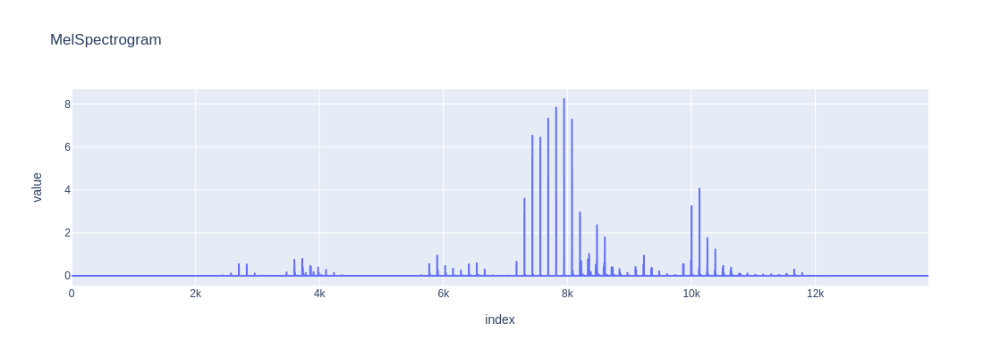

In [43]:
data_futur =  mel_spc(data, sampling_rate)
feature_extraction_plot(data_futur,'MelSpectrogram')

#### 7. Chroma STFT

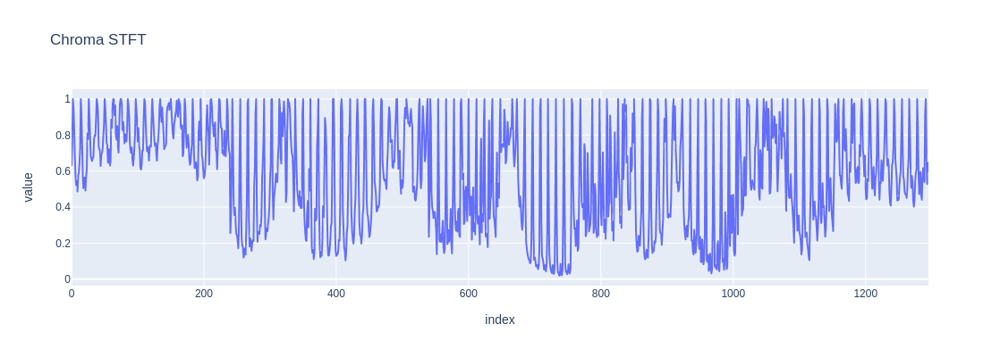

In [44]:
data_futur =  chroma_stft(data, sampling_rate)
feature_extraction_plot(data_futur,'Chroma STFT')

#### 8. Spectral Centroid

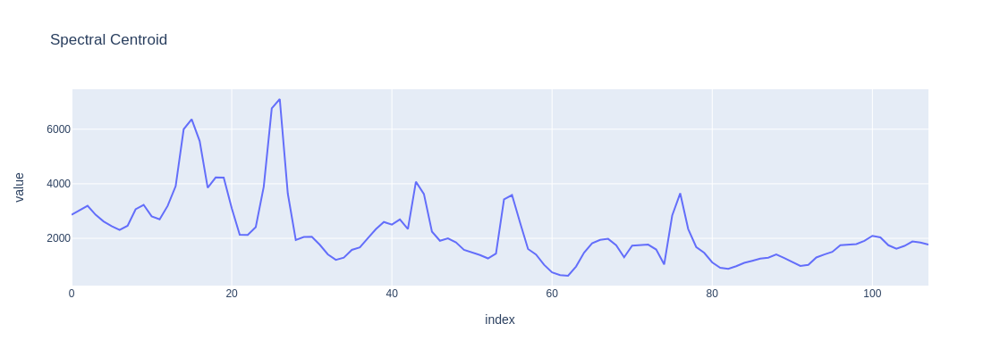

In [45]:
data_futur =  spc(data, sampling_rate)
feature_extraction_plot(data_futur,'Spectral Centroid')

##### 9. Spectral Rollof

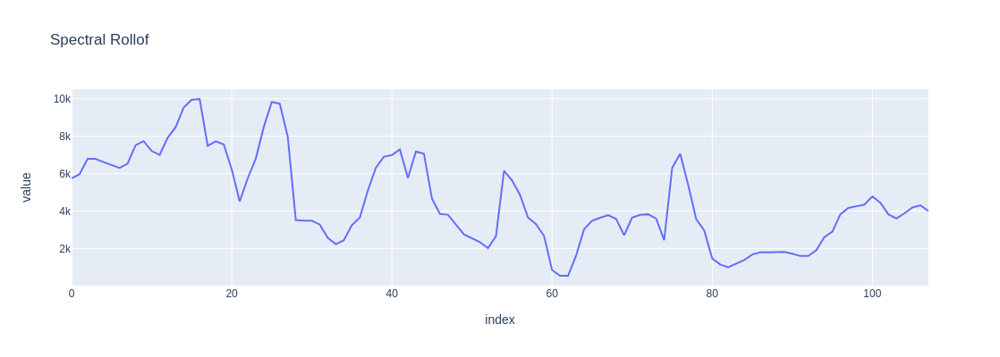

In [46]:
spc_rollof
data_futur =  spc_rollof(data, sampling_rate)
feature_extraction_plot(data_futur,'Spectral Rollof')

In [47]:
print("ZCR: ", zcr(data).shape)
print("Energy: ", energy(data).shape)
print("RMS :", rmse(data).shape)
print("Spectral Centroid :", spc(data, sampling_rate).shape)
print("Spectral Rollof: ", spc_rollof(data, sampling_rate).shape)
print("Chroma STFT: ", chroma_stft(data, sampling_rate).shape)
print("MelSpectrogram: ", mel_spc(data, sampling_rate).shape)
print("MFCC: ", mfcc(data, sampling_rate).shape)

ZCR:  (108,)
Energy:  (108,)
RMS : (108,)
Spectral Centroid : (108,)
Spectral Rollof:  (108,)
Chroma STFT:  (1296,)
MelSpectrogram:  (13824,)
MFCC:  (2160,)


In [48]:
def extract_features(data, sr, frame_length=2048, hop_length=512):
    result = np.array([])
    result = np.hstack((result,
                        zcr(data, frame_length, hop_length),
                        rmse(data, frame_length, hop_length),
                        mfcc(data, sr, frame_length, hop_length)
                        # np.mean(energy(data, frame_length, hop_length),axis=0),
                        # spc(data, sr, frame_length, hop_length),
                        # spc_rollof(data, sr, frame_length, hop_length),
                        # chroma_stft(data, sr, frame_length, hop_length),
                        # mel_spc(data, sr, frame_length, hop_length, flatten=True)
                    ))
    return result

In [49]:
def get_features(path, duration=2.5, offset=0.6):
    
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    data, sample_rate = librosa.load(path, duration=duration, offset=offset)

     # without augmentation
    result1 = extract_features(data, sample_rate)
    result = np.array(result1)

    # data with noise
    noise_data = noise(data, random=True)
    result2 = extract_features(noise_data, sample_rate)
    result = np.vstack((result, result2)) # stacking vertically

    # data with pitching
    pitched_data = pitch(data, sample_rate, random=True)
    result3 = extract_features(pitched_data, sample_rate)
    result = np.vstack((result, result3)) # stacking vertically

    # data with pitching and white_noise
    new_data = pitch(data, sample_rate, random=True)
    data_noise_pitch = noise(new_data, random=True)
    result4 = extract_features(data_noise_pitch, sample_rate)
    result = np.vstack((result, result4)) # stacking vertically

    return result

*  Features Extraction using ZRC, RMSE, MFCC

In [50]:
X, Y = [], []
print("Feature processing...")
for path, emotion, ind in zip(df.Path, df.Emotion, range(df.Path.shape[0])):
    features = get_features(path)
    if ind % 1000 == 0:
        print(f"{ind} samples has been processed...")
    
    for ele in features:
        X.append(ele)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)
print("Done. ")

Feature processing...
0 samples has been processed...
1000 samples has been processed...
2000 samples has been processed...
3000 samples has been processed...
4000 samples has been processed...
5000 samples has been processed...
6000 samples has been processed...
7000 samples has been processed...
8000 samples has been processed...
9000 samples has been processed...
10000 samples has been processed...
11000 samples has been processed...
12000 samples has been processed...
Done. 


In [51]:
extracted_df = pd.DataFrame(X)
extracted_df["labels"] = Y
extracted_df.to_csv("./features.csv", index=False)
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,labels
0,0.343262,0.448730,0.500000,0.472168,0.376953,0.439453,0.539551,0.511230,0.388184,0.299316,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,surprise
1,0.237305,0.352051,0.480957,0.489258,0.499023,0.502930,0.502930,0.510254,0.506836,0.517578,...,-1.159168,-2.651012,-0.238043,1.710331,3.874244,3.927960,3.870702,2.359449,-1.600155,surprise
2,0.040527,0.081543,0.097168,0.097656,0.083984,0.067871,0.111328,0.174805,0.253418,0.312500,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,surprise
3,0.150879,0.209961,0.234863,0.159180,0.112305,0.090820,0.163574,0.262207,0.368652,0.443848,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,surprise
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024414,0.080078,...,-1.461556,-4.752707,-3.807003,1.825411,1.365022,-2.007692,-1.409204,0.004334,-0.162669,neutral


*  Features Extraction using ZRC

In [52]:
def extract_features(data, sr, frame_length=2048, hop_length=512):
    result = np.array([])
    result = np.hstack((result, zcr(data, frame_length, hop_length)))
    return result

In [54]:
X, Y = [], []
print("Feature processing...")
for path, emotion, ind in zip(df.Path, df.Emotion, range(df.Path.shape[0])):
    features = get_features(path)
    if ind % 1000 == 0:
        print(f"{ind} samples has been processed...")

    for ele in features:
        X.append(ele)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)
print("Done. ")

Feature processing...
0 samples has been processed...
1000 samples has been processed...
2000 samples has been processed...
3000 samples has been processed...
4000 samples has been processed...
5000 samples has been processed...
6000 samples has been processed...
7000 samples has been processed...
8000 samples has been processed...
9000 samples has been processed...
10000 samples has been processed...
11000 samples has been processed...
12000 samples has been processed...
Done. 


In [55]:
extracted_df = pd.DataFrame(X)
extracted_df["labels"] = Y
extracted_df.to_csv("./features_zcr.csv", index=False)
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,99,100,101,102,103,104,105,106,107,labels
0,0.343262,0.448730,0.500000,0.472168,0.376953,0.439453,0.539551,0.511230,0.388184,0.299316,...,0.804199,0.822266,0.819824,0.820801,0.821777,0.798828,0.812500,0.757812,0.558105,surprise
1,0.261719,0.385742,0.505859,0.506348,0.495605,0.497070,0.502930,0.505859,0.510742,0.514648,...,0.507324,0.504395,0.497559,0.496094,0.499023,0.503418,0.501465,0.458008,0.329102,surprise
2,0.039062,0.078613,0.094727,0.095703,0.083008,0.069336,0.111328,0.175781,0.253418,0.309570,...,0.353516,0.364258,0.364258,0.348633,0.342773,0.346191,0.354004,0.351074,0.255371,surprise
3,0.255859,0.367676,0.492676,0.473633,0.450684,0.466797,0.467285,0.493652,0.496094,0.488770,...,0.502930,0.504395,0.511719,0.504395,0.497070,0.491211,0.487305,0.440918,0.322754,surprise
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024414,0.080078,...,0.739746,0.770996,0.800293,0.788086,0.816895,0.835938,0.845703,0.796875,0.589355,neutral


*  Features Extraction using RMSE

In [56]:
def extract_features(data, sr, frame_length=2048, hop_length=512):
    result = np.array([])
    result = np.hstack((result, rmse(data, frame_length, hop_length)))
    return result

In [57]:
X, Y = [], []
print("Feature processing...")
for path, emotion, ind in zip(df.Path, df.Emotion, range(df.Path.shape[0])):
    features = get_features(path)
    if ind % 1000 == 0:
        print(f"{ind} samples has been processed...")

    for ele in features:
        X.append(ele)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)
print("Done. ")

Feature processing...
0 samples has been processed...
1000 samples has been processed...
2000 samples has been processed...
3000 samples has been processed...
4000 samples has been processed...
5000 samples has been processed...
6000 samples has been processed...
7000 samples has been processed...
8000 samples has been processed...
9000 samples has been processed...
10000 samples has been processed...
11000 samples has been processed...
12000 samples has been processed...
Done. 


In [58]:
extracted_df = pd.DataFrame(X)
extracted_df["labels"] = Y
extracted_df.to_csv("./features_rmse.csv", index=False)
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,99,100,101,102,103,104,105,106,107,labels
0,0.000003,0.000086,0.000125,0.000131,0.000143,0.000115,0.000070,5.795595e-05,8.536228e-06,2.935468e-06,...,0.000009,0.000008,0.000008,0.000008,0.000007,0.000008,0.000007,0.000007,0.000005,surprise
1,0.000349,0.000436,0.000501,0.000505,0.000509,0.000509,0.000505,5.067652e-04,4.987869e-04,4.883558e-04,...,0.000506,0.000497,0.000496,0.000501,0.000503,0.000504,0.000509,0.000485,0.000411,surprise
2,0.000007,0.000014,0.000045,0.000087,0.000094,0.000097,0.000087,4.444158e-05,2.524136e-05,4.637162e-06,...,0.000006,0.000006,0.000005,0.000005,0.000005,0.000005,0.000005,0.000004,0.000003,surprise
3,0.000748,0.000911,0.001054,0.001044,0.001040,0.001036,0.001036,1.055982e-03,1.066880e-03,1.065244e-03,...,0.001051,0.001069,0.001074,0.001062,0.001064,0.001057,0.001061,0.001017,0.000867,surprise
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.987048e-14,2.814498e-09,3.019724e-07,...,0.000007,0.000007,0.000007,0.000007,0.000007,0.000006,0.000006,0.000005,0.000004,neutral


* Features Extraction using MFCC

In [59]:
def extract_features(data, sr, frame_length=2048, hop_length=512):
    result = np.array([])
    result = np.hstack((result, mfcc(data, sr, frame_length, hop_length)))
    return result

In [60]:
X, Y = [], []
print("Feature processing...")
for path, emotion, ind in zip(df.Path, df.Emotion, range(df.Path.shape[0])):
    features = get_features(path)
    if ind % 1000 == 0:
        print(f"{ind} samples has been processed...")

    for ele in features:
        X.append(ele)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)
print("Done. ")

Feature processing...
0 samples has been processed...
1000 samples has been processed...
2000 samples has been processed...
3000 samples has been processed...
4000 samples has been processed...
5000 samples has been processed...
6000 samples has been processed...
7000 samples has been processed...
8000 samples has been processed...
9000 samples has been processed...
10000 samples has been processed...
11000 samples has been processed...
12000 samples has been processed...
Done. 


In [61]:
extracted_df = pd.DataFrame(X)
extracted_df["labels"] = Y
extracted_df.to_csv("./features_mfcc.csv", index=False)
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2151,2152,2153,2154,2155,2156,2157,2158,2159,labels
0,-836.056152,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,surprise
1,-570.003487,1.197243,1.255092,-3.564422,-0.638827,0.623328,1.387042,2.897087,2.724433,4.172999,...,-1.873411,-0.439743,-7.706072,-1.822334,-1.674423,-3.355158,3.119024,2.278032,-1.538715,surprise
2,-881.584656,5.148536,4.076508,2.493722,0.659431,-1.143967,-2.665554,-3.728205,-4.249881,-4.241667,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,surprise
3,-648.940197,-3.547080,2.761682,-0.540265,1.560255,-4.287701,-0.708513,4.310824,-1.258069,-3.188684,...,-3.346332,-7.575748,-3.131421,-7.384761,-2.084824,3.562538,0.524190,2.702980,-0.325480,surprise
4,-996.581726,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.461556,-4.752707,-3.807003,1.825411,1.365022,-2.007692,-1.409204,0.004334,-0.162669,neutral
